#### 깡통 모델 만들기

In [49]:
import importlib
import Image_Process_utils
importlib.reload(Image_Process_utils)
from Image_Process_utils import *

current path: C:\Users\NormalKim\[0_GAN]\color_mnist2


In [57]:
import torchvision.models as models
from torchvision.models.resnet import ResNet, BasicBlock, Bottleneck
import torch.nn as nn
from torchsummary import summary
from PIL import Image
from PIL import ImageDraw
from model_utils import *
from matplotlib.lines import Line2D

In [66]:
from Training_utils import *
import time
from torch.utils.tensorboard import SummaryWriter
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
import torchvision

In [77]:
class MyResNet(ResNet):
    '''
    basic setting : ResNet-18 with Basic Block
    could use different blocks (i.e. Bottleneck architecture) to create a larger network 
    ''' 
    def __init__(self, block = BasicBlock, cfg = [2,2,2,2]):
        super(MyResNet, self).__init__(block, cfg)
        self.Linear1 = nn.Linear(512,10)
        self.Linear2 = nn.Linear(512,2)
        self.Linear3 = nn.Linear(512*4,10)
        self.Linear4 = nn.Linear(512*4,2)
        self.block = block
        
    def forward(self, x):
        # change forward here
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)

        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        if self.block == BasicBlock: 
            y_cls = self.Linear1(x)
            y_coord = self.Linear2(x)
        if self.block == Bottleneck:  
            y_cls = self.Linear3(x)
            y_coord = self.Linear4(x)
    
        return y_cls, y_coord

In [22]:
# cuda 로 안 바꾸고 cpu로 집어넣고 순전파 테스트
model50 = MyResNet(block = BasicBlock, cfg = [3,4,6,3]) # 레즈넷 50
model50.forward(torch.randn(1,3,224,224))

(tensor([[-0.9229,  0.6655,  1.0669,  0.2574, -0.8871,  0.0226,  0.0388,  0.2503,
           0.5079, -0.7118]], grad_fn=<AddmmBackward>),
 tensor([[-0.4307,  0.0563]], grad_fn=<AddmmBackward>))

In [9]:
# cuda로 바꾸면 summary 를 보여주기 가능 
#model50 = MyResNet(block = BasicBlock, cfg = [3,4,6,3]).to('cuda')
summary(model50.to('cuda'), input_size = (3, 224, 224), device = 'cuda') # 파라미터 ~21.2 M 

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]          36,864
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
       BasicBlock-11           [-1, 64, 56, 56]               0
           Conv2d-12           [-1, 64, 56, 56]          36,864
      BatchNorm2d-13           [-1, 64, 56, 56]             128
             ReLU-14           [-1, 64,

#### 데이터 로더

In [10]:
os.listdir()

['.ipynb_checkpoints',
 '2.jpg',
 '3.png',
 'color_mnist',
 'color_mnist2',
 'create_new_mnist.ipynb',
 'data',
 'dataset',
 'drawcircle_macro.py',
 'GAN_utils.py',
 'Hands.ipynb',
 'Hands_sobu',
 'hand_1.jpg',
 'Image_Process_utils.py',
 'KakaoTalk_20200725_122754885.jpg',
 'KakaoTalk_20200725_122755335.jpg',
 'label1',
 'lena.png',
 'len_full.jpg',
 'mnist',
 'mnist.csv',
 'mnist_eda.R',
 'model_utils.py',
 'opencv_macro.py',
 'runs',
 'synthetic_digits',
 'tb_utils.py',
 'Toy_Model_Mnist_GAN.ipynb',
 'Toy_Model_Mnist_Regression.ipynb',
 'Training_utils.py',
 '__pycache__']

In [11]:
os.chdir('./color_mnist2')

In [14]:
#데이터 불러오기 
# dir : 'C:\\Users\\NormalKim\\[0_GAN]\\color_mnist2'
image_size = 224
batch_size = 32
my_transforms = transforms.Compose([
    transforms.Resize(image_size),
    transforms.ToTensor(),
    #transforms.Normalize((0.5,), (0.5,)),
    ])

train_dir = './train/original'
test_dir = './test/original'
train_set = CoordDataSet(json_file = './color_mnist_train.json', rootdir = train_dir, transform = my_transforms )
test_set = CoordDataSet(json_file = './color_mnist_test.json', rootdir = test_dir, transform = my_transforms )

train_loader = DataLoader(train_set, batch_size = 32, shuffle = False)
test_loader = DataLoader(test_set, batch_size = 32, shuffle = False)

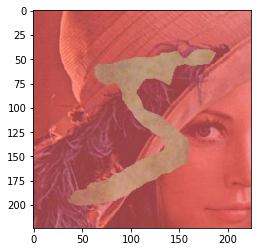

In [15]:
import matplotlib.pyplot as plt
plt.imshow(np.transpose(iter(train_loader).__next__()[0][0], (1,2,0)))

In [25]:
iter(train_loader).__next__()[1]

[tensor([5, 0, 4, 1, 9, 2, 1, 3, 1, 4, 3, 5, 3, 6, 1, 7, 2, 8, 6, 9, 4, 0, 9, 1,
         1, 2, 4, 3, 2, 7, 3, 8]),
 tensor([115,  67,  50, 101, 154, 166,  86, 219,  75,  57, 210,  98, 221, 168,
          87, 214, 158, 118, 145, 151,  69,  70, 149,  99, 101, 175,  36, 227,
         173, 200, 206, 120]),
 tensor([135,  78, 128,  58, 198,  77,  70,  88,  57, 128,  80, 115,  86, 136,
          52, 133,  72, 195, 116, 186, 146,  84, 182,  58,  71,  92, 121, 100,
          95, 119,  77, 205])]

In [37]:
#target = iter(train_loader).__next__()[1]
out1, out2 = model50.forward(torch.randn(32,3,224,224))

In [40]:
nn.CrossEntropyLoss()(out1, target[0])

tensor(2.4067, grad_fn=<NllLossBackward>)

In [41]:
nn.MSELoss()(out2[:,0], target[1])

tensor(21209.1699, grad_fn=<MseLossBackward>)

In [42]:
nn.MSELoss()(out2[:,1], target[2])

tensor(14134.2227, grad_fn=<MseLossBackward>)

#### 트레이너 모듈 만들기

In [219]:
writer_mnist = SummaryWriter(f'runs/col_mnist')

In [59]:
from tb_utils import *

In [62]:
targets[1]

tensor([115.,  67.,  50., 101., 154., 166.,  86., 219.,  75.,  57., 210.,  98.,
        221., 168.,  87., 214., 158., 118., 145., 151.,  69.,  70., 149.,  99.,
        101., 175.,  36., 227., 173., 200., 206., 120.])

In [65]:
out2[0][0]

tensor(0.5898, grad_fn=<SelectBackward>)

start training
Epoch [0 / 10] Batch 0/1875 Loss: 34504.7109
Epoch [0 / 10] Batch 10/1875 Loss: 39655.2969
Epoch [0 / 10] Batch 20/1875 Loss: 30959.0156
Epoch [0 / 10] Batch 30/1875 Loss: 34605.3242
Epoch [0 / 10] Batch 40/1875 Loss: 42066.8984
Epoch [0 / 10] Batch 50/1875 Loss: 32349.4531
Epoch [0 / 10] Batch 60/1875 Loss: 36586.3086


C:\Users\NormalKim\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Epoch [0 / 10] Batch 70/1875 Loss: 31732.7695
Epoch [0 / 10] Batch 80/1875 Loss: 31827.1113
Epoch [0 / 10] Batch 90/1875 Loss: 27345.0879
Epoch [0 / 10] Batch 100/1875 Loss: 30314.0273
Epoch [0 / 10] Batch 110/1875 Loss: 29636.3320
Epoch [0 / 10] Batch 120/1875 Loss: 34931.5430
Epoch [0 / 10] Batch 130/1875 Loss: 25047.5801
Epoch [0 / 10] Batch 140/1875 Loss: 27378.3770
Epoch [0 / 10] Batch 150/1875 Loss: 32061.7363
Epoch [0 / 10] Batch 160/1875 Loss: 27634.9824
Epoch [0 / 10] Batch 170/1875 Loss: 31726.5625
Epoch [0 / 10] Batch 180/1875 Loss: 30240.8320
Epoch [0 / 10] Batch 190/1875 Loss: 30981.3242
Epoch [0 / 10] Batch 200/1875 Loss: 24044.3945
Epoch [0 / 10] Batch 210/1875 Loss: 24299.0898
Epoch [0 / 10] Batch 220/1875 Loss: 27256.7695
Epoch [0 / 10] Batch 230/1875 Loss: 22670.8047
Epoch [0 / 10] Batch 240/1875 Loss: 24105.9102
Epoch [0 / 10] Batch 250/1875 Loss: 26349.8203
Epoch [0 / 10] Batch 260/1875 Loss: 21055.1270
Epoch [0 / 10] Batch 270/1875 Loss: 30061.0488
Epoch [0 / 10] B

Epoch [1 / 10] Batch 1730/1875 Loss: 317.0515
Epoch [1 / 10] Batch 1740/1875 Loss: 211.0849
Epoch [1 / 10] Batch 1750/1875 Loss: 111.9800
Epoch [1 / 10] Batch 1760/1875 Loss: 941.1256
Epoch [1 / 10] Batch 1770/1875 Loss: 148.2826
Epoch [1 / 10] Batch 1780/1875 Loss: 283.0879
Epoch [1 / 10] Batch 1790/1875 Loss: 701.3904
Epoch [1 / 10] Batch 1800/1875 Loss: 497.7192
Epoch [1 / 10] Batch 1810/1875 Loss: 167.9854
Epoch [1 / 10] Batch 1820/1875 Loss: 302.2450
Epoch [1 / 10] Batch 1830/1875 Loss: 567.3406
Epoch [1 / 10] Batch 1840/1875 Loss: 43.1481
Epoch [1 / 10] Batch 1850/1875 Loss: 62.8162
Epoch [1 / 10] Batch 1860/1875 Loss: 447.7794
Epoch [1 / 10] Batch 1870/1875 Loss: 138.5224
Epoch [2 / 10] Batch 0/1875 Loss: 444.1462
Epoch [2 / 10] Batch 10/1875 Loss: 620.0209
Epoch [2 / 10] Batch 20/1875 Loss: 309.2220
Epoch [2 / 10] Batch 30/1875 Loss: 106.9996
Epoch [2 / 10] Batch 40/1875 Loss: 745.6504
Epoch [2 / 10] Batch 50/1875 Loss: 696.0295
Epoch [2 / 10] Batch 60/1875 Loss: 334.0647
Epoch

KeyboardInterrupt: 

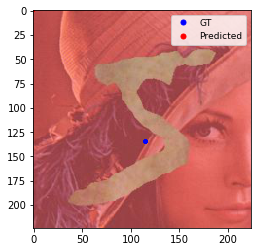

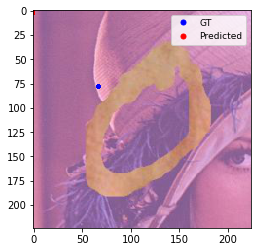

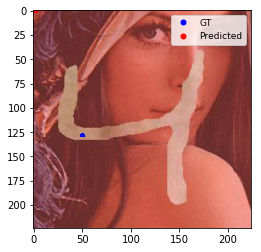

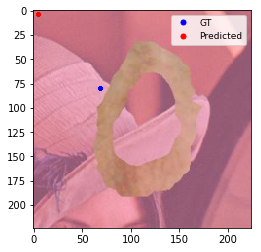

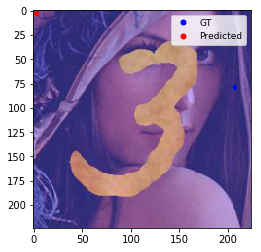

...

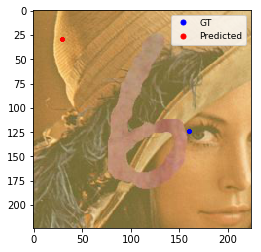

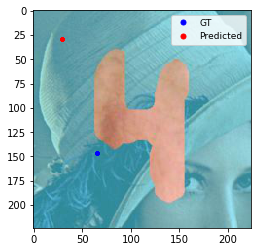

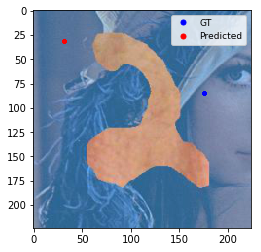

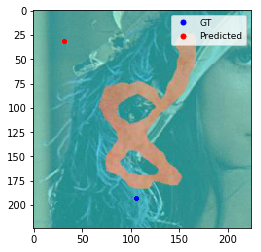

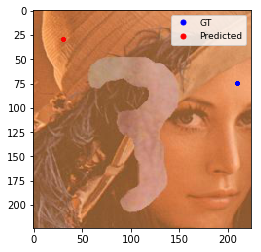

Error in callback <function flush_figures at 0x000002AB296C01E0> (for post_execute):


KeyboardInterrupt: 

In [67]:
# hyperparameters
# 1. Optimizer
learning_rate = 0.0001
momentum = 0.9 
num_epochs = 10

optimizer = torch.optim.Adam(model50.parameters(), lr = learning_rate, betas = (0.5, 0.999))

# 2. Criterion 
cls_loss = nn.CrossEntropyLoss()
mse_loss = nn.MSELoss()
# smooth l1: nn.SmoothL1Loss()
# dropout 

start_time = time.time()
history = []
total_time = 0

# 3. For loop
dataloader = train_loader

print('start training')
for epoch in range(num_epochs):
    epoch_start = time.time()
   # print("Epoch: {}/{}".format(num_epochs+1, num_epochs))
    # set to train mode
    model50.train()
    
    # loss
    train_loss = 0.0
    
    for batch_idx, (imgs, targets) in enumerate(dataloader):
       # imgs = imgs.to(torch.float32)
        targets = [ i.to(torch.float32) for i in targets]
        
        optimizer.zero_grad()
        out1, out2 = model50(imgs)
        
      #  loss_cls = cls_loss(out1, targets[0] )
        loss_x = mse_loss(out2[:,0], targets[1] )
        loss_y = mse_loss(out2[:,1], targets[2] )
        loss =  loss_x + loss_y
        
        # backpropagation 
        loss.backward()
        
        # update parameters
        optimizer.step()
        
        # compute total loss
        train_loss += loss.item() * imgs.size(0)
       #  print('avg loss: ', loss.item())
        
        if batch_idx % 10 == 0:
            print(f'Epoch [{epoch} / {num_epochs}] Batch {batch_idx}/{len(dataloader)} Loss: {loss.item() :.4f}')
            with torch.no_grad():
                img_list = gen_train_monitor_plot(imgs, out2, targets)
                imgs_grid = torchvision.utils.make_grid(img_list, normalize = True)
                writer = SummaryWriter(f'runs/check2')
                writer.add_image('imgs', imgs_grid)
                writer.flush()
        # class accuracy
        
        # pixel accuracy 
        
        
        # tensorboard : with loss, img 
        
        
        

In [69]:
# 모델 저장 
torch.save(model50.state_dict(), f"ResNet50_0805_e%d.pth" % epoch)

In [78]:
# 저장된 모델 불러오기 
model = MyResNet(block = BasicBlock, cfg = [3,4,6,3]) # 레즈넷 50
model.load_state_dict(torch.load('ResNet50_0805_e3.pth'))

#### 테스트하기

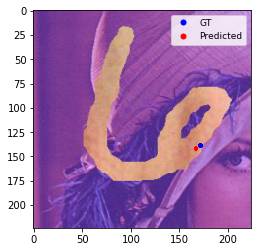

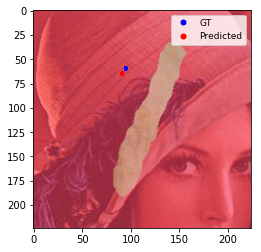

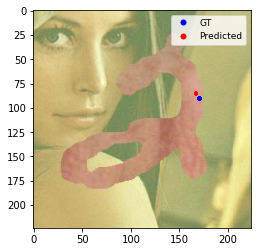

In [96]:
t1 = iter(test_loader).__next__()
imgs = t1[0].to(torch.float32)
targets = [i.to(torch.float32) for i in t1[1] ]
# model output 
out1, out2 = model(imgs)
img_list = gen_train_monitor_plot(imgs, out2, targets)

In [87]:
# test set 
for batch_i, (imgs, targets) in enumerate(train_loader):
    imgs = imgs.to(torch.float32)
    targets = [ i.to(torch.float32) for i in targets]

    optimizer.zero_grad()
    out1, out2 = model50(imgs)


KeyboardInterrupt: 

In [86]:
targets

[tensor([6., 1., 2., 9., 3., 2., 9., 6., 0., 6., 6., 4., 1., 6., 9., 1., 3., 2.,
         5., 4., 2., 1., 1., 3., 3., 9., 2., 8., 8., 4., 2., 3.]),
 tensor([172.,  95., 171., 153., 218., 178., 163., 175.,  69., 178., 153.,  58.,
          91., 151., 150.,  95., 230., 159., 116.,  65., 165., 101.,  86., 201.,
         229., 140., 180., 125., 130.,  58., 170., 214.]),
 tensor([139.,  60.,  90., 189.,  78.,  84., 200., 141.,  84., 150., 128., 136.,
          65., 129., 198.,  70.,  98.,  72., 145., 133.,  69.,  53.,  67.,  65.,
          87., 186.,  88., 211., 207., 138.,  80.,  83.])]

In [ ]:
# modification of trainer module 

# LR scheduling
# saving model
# validation loop

# parser
# different backbone

# data augmentation

# YOLO

In [ ]:
img_list = gen_train_monitor_plot(imgs, out2, targets)
imgs_grid = torchvision.utils.make_grid(img_list, normalize = True)
writer = SummaryWriter(f'runs/check3')
writer.add_image('imgs', imgs_grid)
writer.flush()